## This is based on QueryAboutCollections 

In [1]:
import os
import matplotlib.pyplot as plt
import re

import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.io import fits
from astropy.time import Time

from scipy.optimize import curve_fit
import scipy.ndimage as ndimage

In [2]:
# LSST Display
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [3]:
# Butler
import lsst.daf.butler as dafButler
from lsst.daf.butler import CollectionType
#from lsst.daf.butler import CollectionTypes

In [4]:
embargo = True

In [5]:
if embargo:
    repo="/sdf/group/rubin/repo/oga/"  # /repo/embargo
else:
    repo = "/sdf/group/rubin/repo/main" # repo/main
butler = dafButler.Butler(repo)
registry = butler.registry

Now we take the collections that correspond to LATISS/calib 

In [6]:
calibCollections = ['LATISS/defaults','LATISS/raw/all']
for col in registry.queryCollections("*LATISS/calib*"):
    #print(col)
    calibCollections.append(col)
#calibCollections = ...

We need to specify an exposure in order to obtain the master flat that was applied to it. We can take it from the science exposures obtained with 02_search_raw_spectra_make_pseudo-postISRCCD

In [7]:
#exposure_selected=2023021400848
flat_date = 20230116
flats_selected = [2023011600015, 2023011600014, 2023011600016]

Create an output directory for the flats corresponding to the selected exposure 

In [94]:
#outdir = './special_flats_{0}/'.format(exposure_selected)
outdir_base = './special_flats/'
if os.path.exists(outdir_base)==False:
    os.mkdir(outdir_base)
outdir_1 = os.path.join(outdir_base,str(flat_date))
if os.path.exists(outdir_1)==False:
    os.mkdir(outdir_1)
outdir_2 = os.path.join(outdir_1,str(flats_selected[0]))
if os.path.exists(outdir_2)==False:
    os.mkdir(outdir_2)
outdir = os.path.join(outdir_2,'ws_analysis')
if os.path.exists(outdir)==False:
    os.mkdir(outdir)
print(outdir)

./special_flats/20230116/2023011600015/ws_analysis


In [89]:
save_flat = False
save_sflat = False

We check how the selected flats look like:

2023011600015


/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-6.0.0/Linux64/obs_base/g7cb150fdc4+4d54c50af8/python/lsst/obs/base/formatters/fitsExposure.py:643: UserWarning: Reading file:///tmp/tmppnzwljte.fits with data ID {instrument: 'LATISS', detector: 0, physical_filter: 'empty~empty', ...}: filter label mismatch (file is None, data ID is FilterLabel(band="white", physical="empty~empty")).  This is probably a bug in the code that produced it.
  warnings.warn(


2023011600014


/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-6.0.0/Linux64/obs_base/g7cb150fdc4+4d54c50af8/python/lsst/obs/base/formatters/fitsExposure.py:643: UserWarning: Reading file:///tmp/butler-cache-dir-woz738j4/exempt/c0c90d30-e311f5dc-5763-4be5-9d15-4afc28415ac7.fits with data ID {instrument: 'LATISS', detector: 0, physical_filter: 'empty~empty', ...}: filter label mismatch (file is None, data ID is FilterLabel(band="white", physical="empty~empty")).  This is probably a bug in the code that produced it.
  warnings.warn(


2023011600016


/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-6.0.0/Linux64/obs_base/g7cb150fdc4+4d54c50af8/python/lsst/obs/base/formatters/fitsExposure.py:643: UserWarning: Reading file:///tmp/butler-cache-dir-woz738j4/exempt/3d5a5f8f-e311f5dc-5763-4be5-9d15-4afc28415ac7.fits with data ID {instrument: 'LATISS', detector: 0, physical_filter: 'empty~empty', ...}: filter label mismatch (file is None, data ID is FilterLabel(band="white", physical="empty~empty")).  This is probably a bug in the code that produced it.
  warnings.warn(


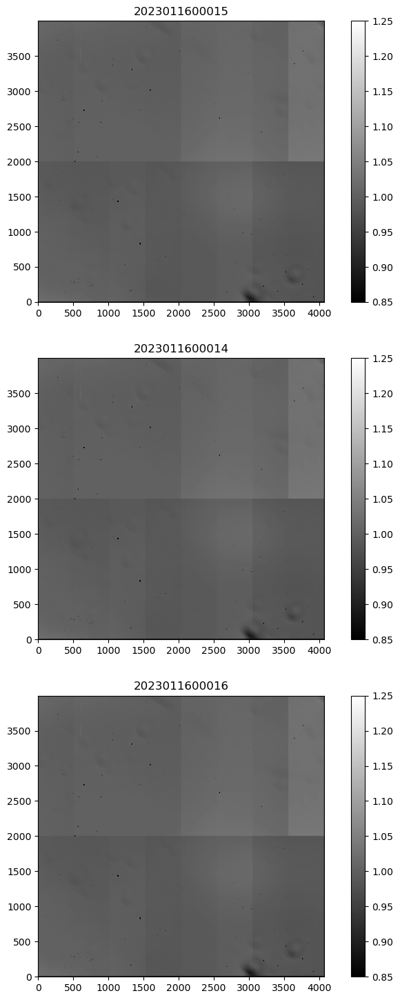

In [9]:
fig = plt.figure(figsize=(10,18))
if len(flats_selected)<5:
    num_plots = len(flats_selected)
else:
    num_plots = 4

flat_arrays = []
for i,fid_ in enumerate(flats_selected):
    print(fid_)
    flat_img = butler.get(
        "flat",
        instrument="LATISS", exposure=fid_, detector=0,
        collections=calibCollections)
    flat_array_ = flat_img.getImage().array
    flat_arrays.append(flat_array_)
    img_idx = int('{0}1{1}'.format(num_plots,i+1))
    ax=fig.add_subplot(img_idx)
    im = ax.imshow(flat_array_,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
    ax.set_title(fid_)
    fig.colorbar(im,ax=ax)

Plot the same with afw_display 

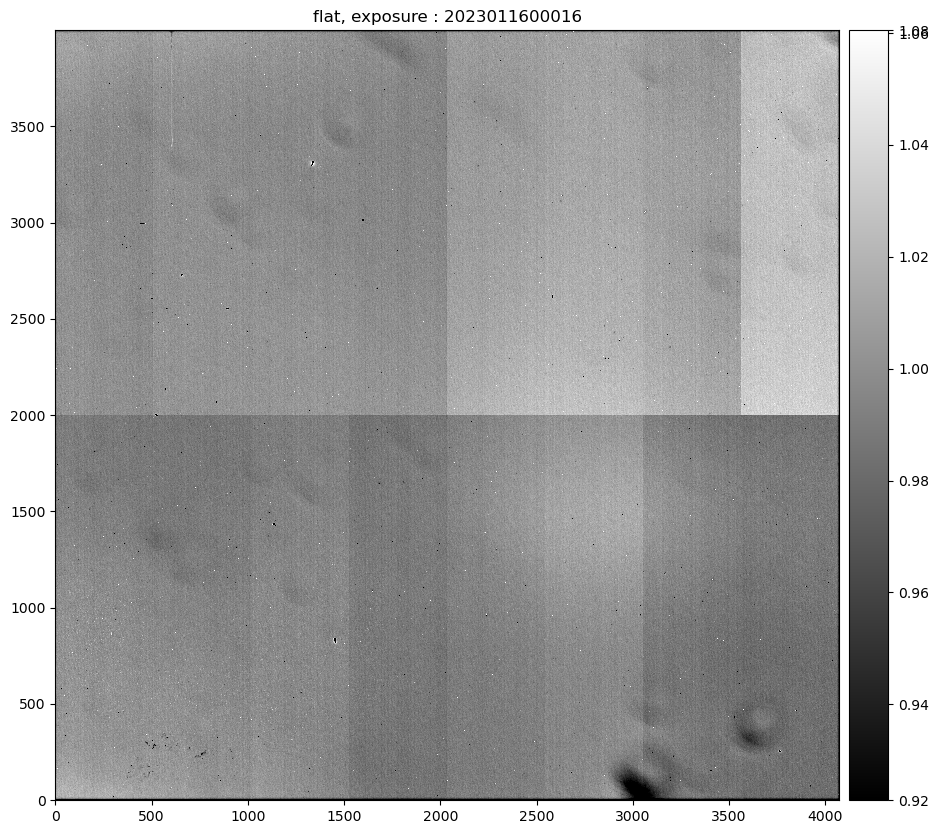

In [10]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
title = f"flat, exposure : {flats_selected[-1]}"
afw_display.mtv(flat_img.image,title=title)

In [11]:
if len(flats_selected)==1:
    flat_array = flats_array[0]
    flat_selected = flats_selected[0]
else:
    all_equal = []
    for flat_arr in flat_arrays[1:]:
        equal_ = (flat_arr.flatten()==flat_arrays[0].flatten()).all()
        print(equal_)
        all_equal.append(equal_)
    all_equal = np.array(all_equal)
    if (all_equal==True).all():
        flat_array = flat_arrays[0]
        flat_selected = flats_selected[0]
        print('All flats are equal')
    else:
        print('ATTENTION: all flats are not equal')

True
True
All flats are equal


# Extract data from image 
We do this to work with our own tools 

In [12]:
#flat_array = flat_img.getImage().array

In [13]:
flat_array.shape

(4000, 4072)

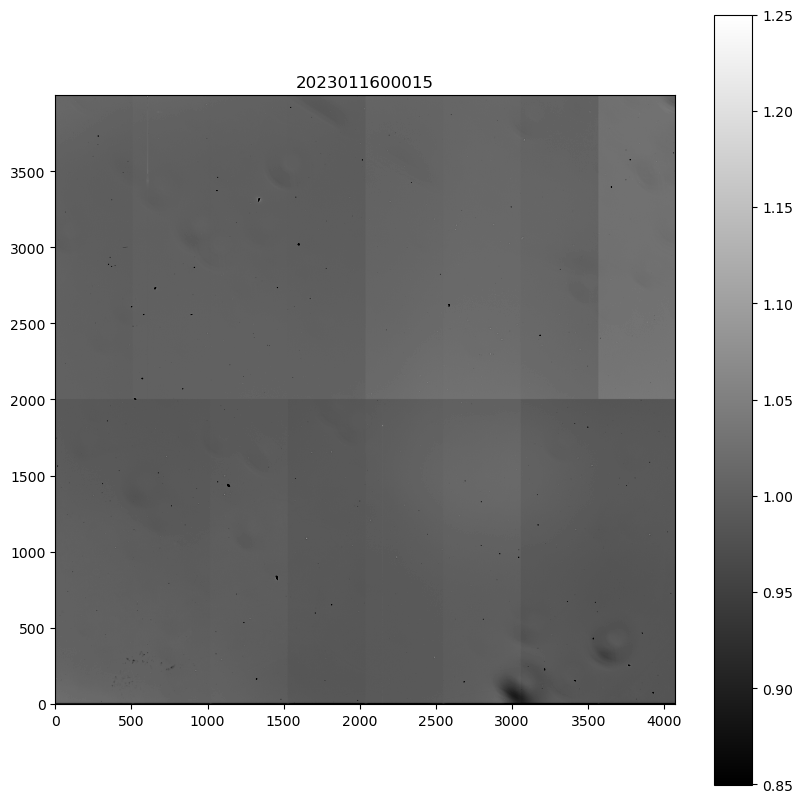

In [14]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(flat_array,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
ax.set_title(flat_selected)
plt.colorbar(im,ax=ax)
plt.savefig(os.path.join(outdir,'00_flat.png'))

In [15]:
type(flat_img.getDetector())

lsst.afw.cameraGeom.Detector

In [16]:
flat_img.getDetector().getName()

'RXX_S00'

In [17]:
amplis = list(flat_img.getDetector())
print(amplis)

[<lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e530b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e532b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e53230>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e53030>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e522b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e51c70>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e53ab0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52130>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e531f0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52a70>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52b30>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52cb0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52cf0>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e53130>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e52e70>, <lsst.afw.cameraGeom.Amplifier object at 0x7f5db3e53970>]


In [18]:
for ampIdx, amp in enumerate(amplis):
    ampName = amp.getName()
    print(ampIdx,ampName)

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
8 C07
9 C06
10 C05
11 C04
12 C03
13 C02
14 C01
15 C00


Extract metadata from image: 

In [19]:
md = flat_img.getMetadata().toDict()
filter_ = md['FILTER']
print(filter_)

empty_1


Useful documentation: https://pipelines.lsst.io/py-api/lsst.geom.Box2I.html#lsst.geom.Box2I

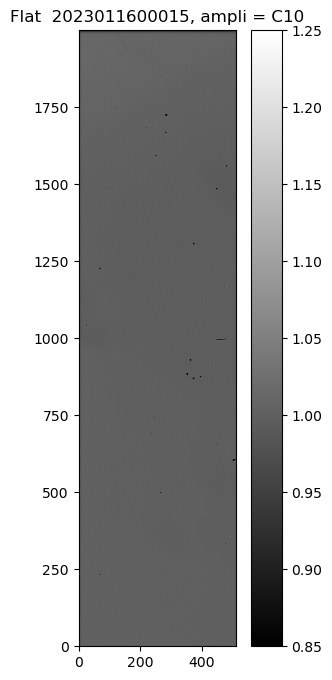

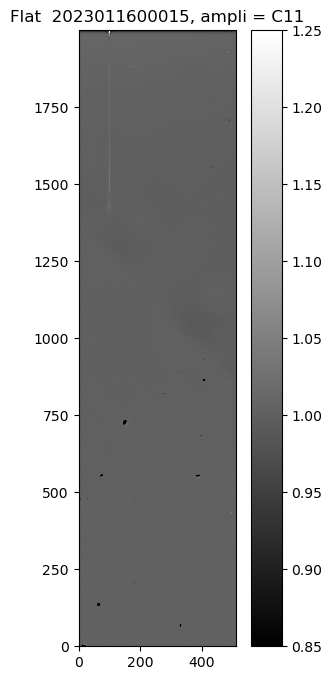

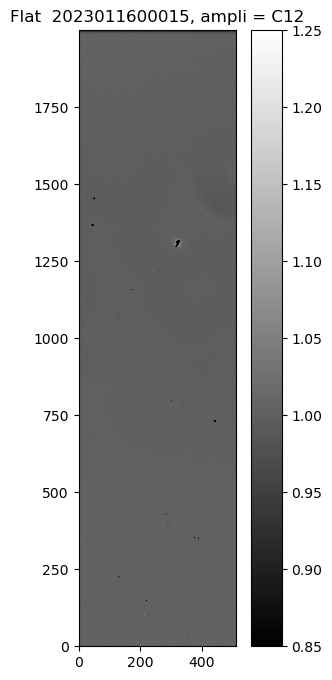

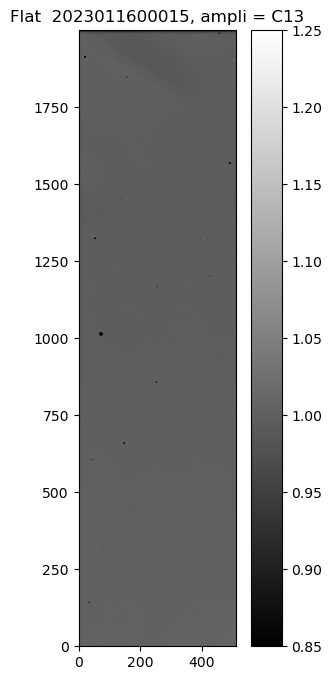

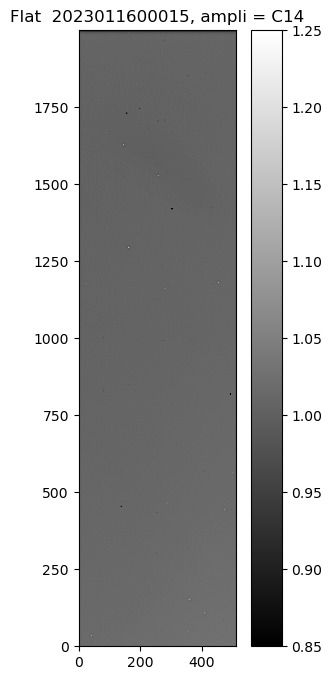

...

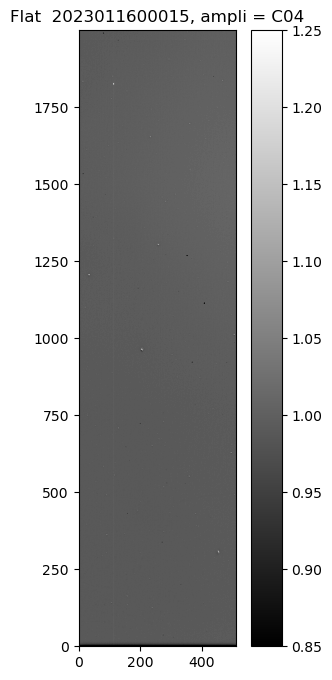

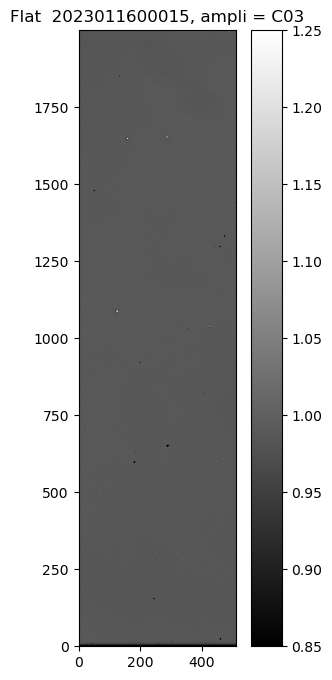

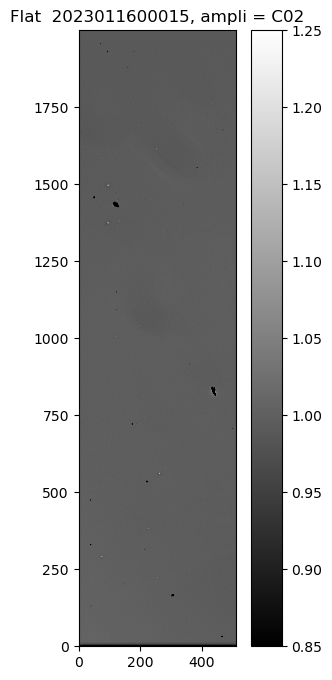

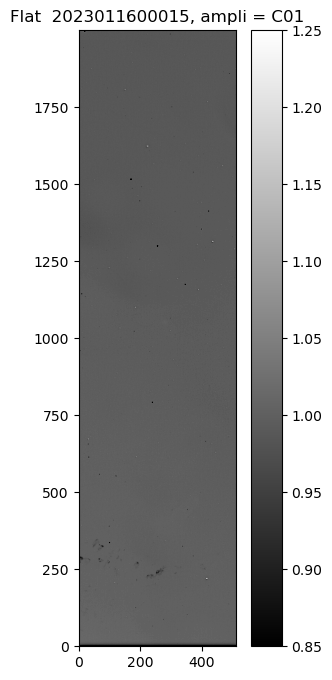

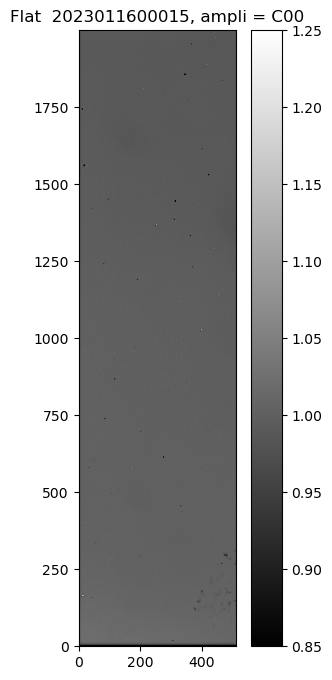

In [20]:
all_img = []
all_nameimg = []
all_boximg = {}

for ampIdx, amp in enumerate(flat_img.getDetector()):
    ampName = amp.getName()
    all_nameimg.append(ampName)
    xbegin = amp.getBBox().x.begin
    xend = amp.getBBox().x.end
    ybegin = amp.getBBox().y.begin
    yend = amp.getBBox().y.end
    all_boximg[ampName] = (xbegin,xend,ybegin,yend)
    
    # This can work only on postISRCCD
    ampExp = flat_img.Factory(flat_img, amp.getBBox())
    amp_img = ampExp.getImage().array
    all_img.append(amp_img) 
    fig = plt.figure(figsize=(4,8))
    ax=fig.add_subplot(111)
    im = ax.imshow(amp_img,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
    title = 'Flat  {0}, ampli = {1}'.format(flat_selected,ampName)
    ax.set_title(title)
    fig.colorbar(im,ax=ax)
   

In [21]:
all_boximg

{'C10': (0, 509, 2000, 4000),
 'C11': (509, 1018, 2000, 4000),
 'C12': (1018, 1527, 2000, 4000),
 'C13': (1527, 2036, 2000, 4000),
 'C14': (2036, 2545, 2000, 4000),
 'C15': (2545, 3054, 2000, 4000),
 'C16': (3054, 3563, 2000, 4000),
 'C17': (3563, 4072, 2000, 4000),
 'C07': (3563, 4072, 0, 2000),
 'C06': (3054, 3563, 0, 2000),
 'C05': (2545, 3054, 0, 2000),
 'C04': (2036, 2545, 0, 2000),
 'C03': (1527, 2036, 0, 2000),
 'C02': (1018, 1527, 0, 2000),
 'C01': (509, 1018, 0, 2000),
 'C00': (0, 509, 0, 2000)}

## Let's organise the amplifiers separately 

We will work like this except to compute the smooth component, which we compute on the full image to preserve changes between amplifiers (see next point) 

In [22]:
mapampid = [0,1,2,3,4,5,6,7,15,14,13,12,11,10,9,8]

In [23]:
num_amplis = len(mapampid)

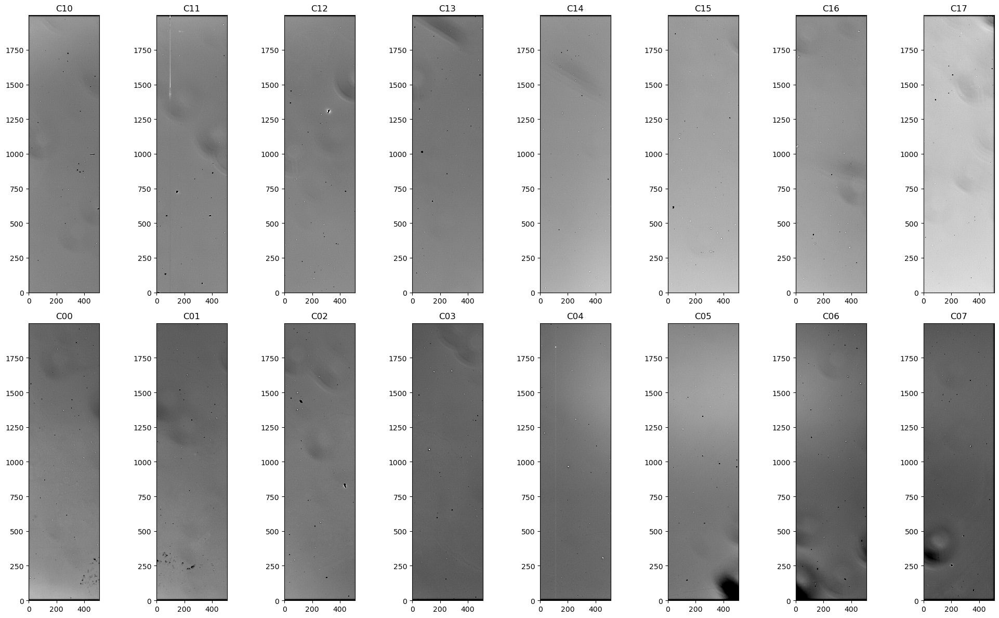

In [24]:
fig=plt.figure(figsize=(20,12))

for idx in range(num_amplis):
    #print(mapampid[idx]+1)
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.imshow(all_img[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig(os.path.join(outdir,'00_flat_amplis.png'))

# Save normal flat in fits file 

In [92]:
if save_flat:
    filename_out = 'flat_{0}_{1}.fits'.format(flat_selected,filter_)
    fullfilename_out = os.path.join(outdir,'../',filename_out)

    print(f">>>>  output filename {filename_out}")

    hdr = fits.Header()

    for key,value in md.items():
        hdr[str(key)] = value


    # Be carefull for Spectractor, 2 hdu units are necessary

    primary_hdu = fits.PrimaryHDU(header=hdr)
    image_hdu = fits.ImageHDU(flat_array)

    hdu_list = fits.HDUList([primary_hdu, image_hdu])

    hdu_list.writeto(fullfilename_out,overwrite=True)



Let's look at an single amplifier: 

In [25]:
ampli0_name = 'C00'
id0 = np.where(np.array(all_nameimg)==ampli0_name)[0][0]
print(id0)
ampli0_ = all_img[id0]

15


In [26]:
ampli0_median = np.median(ampli0_.ravel())

We normalise it by its median 

In [27]:
ampli0 = ampli0_/ampli0_median

In [28]:
column1 = 200
column2 = 400
row = 300

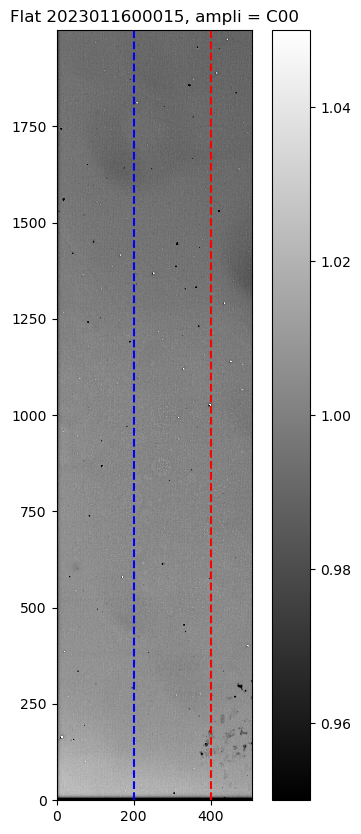

In [29]:
fig = plt.figure(figsize=(5,10))
ax=fig.add_subplot(111)
im = ax.imshow(ampli0,cmap="gray",vmin=0.95,vmax=1.05,origin='lower')#,norm=LogNorm())
ax.axvline(x=column1,ls='--',color='b')
ax.axvline(x=column2,ls='--',color='r')
title = 'Flat {0}, ampli = {1}'.format(flat_selected,ampli0_name)
ax.set_title(title)
fig.colorbar(im,ax=ax)
plt.savefig(os.path.join(outdir,'00_flat_ampli_{0}_columns.png'.format(ampli0_name)))

In [30]:
col1_ = ampli0_[10:row,column1]
col2_ = ampli0_[10:row,column2]
col1 = ampli0[10:row,column1]
col2 = ampli0[10:row,column2]

In [31]:
print(len(col1),len(col2))

290 290


In [32]:
col_color = ['b','r']

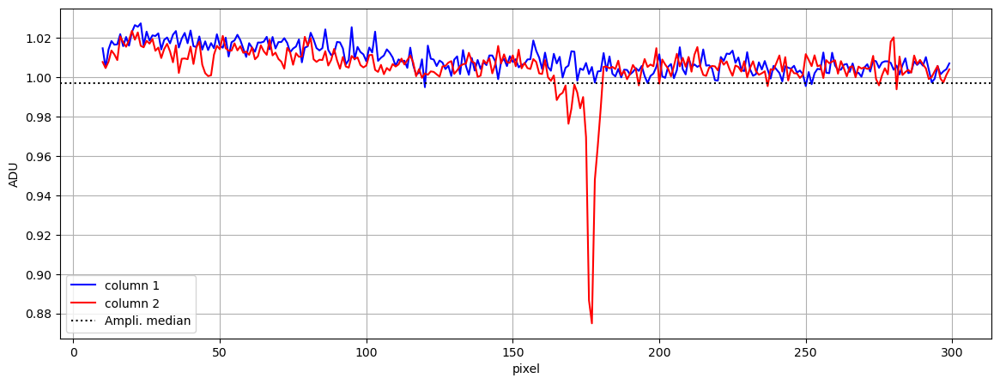

In [33]:
x_ = np.arange(10,10+len(col1))
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(x_,col1_,ls='-',color='b',label='column 1')
ax.plot(x_,col2_,ls='-',color='r',label='column 2')
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel')
ax.set_ylabel('ADU')
ax.legend(loc="best")
plt.savefig(os.path.join(outdir,'01_columns.png'))

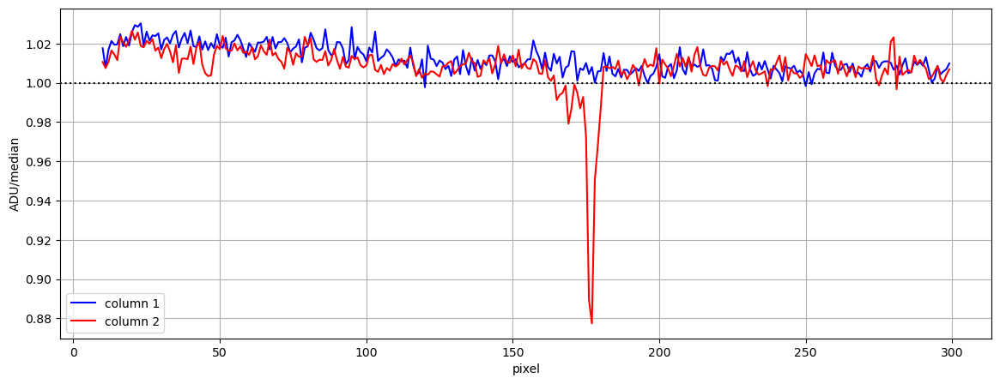

In [34]:
x_ = np.arange(10,10+len(col1))
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(x_,col1,ls='-',color='b',label='column 1')
ax.plot(x_,col2,ls='-',color='r',label='column 2')
ax.axhline(y=1.0,ls=':',color='k')
ax.grid()
ax.set_xlabel('pixel')
ax.set_ylabel('ADU/median')
ax.legend(loc="best")
plt.savefig(os.path.join(outdir,'01_columns_normalised.png'))

# Make median smoothing 

## First, we normalise the each amplifier by its median so we put them at the same level 

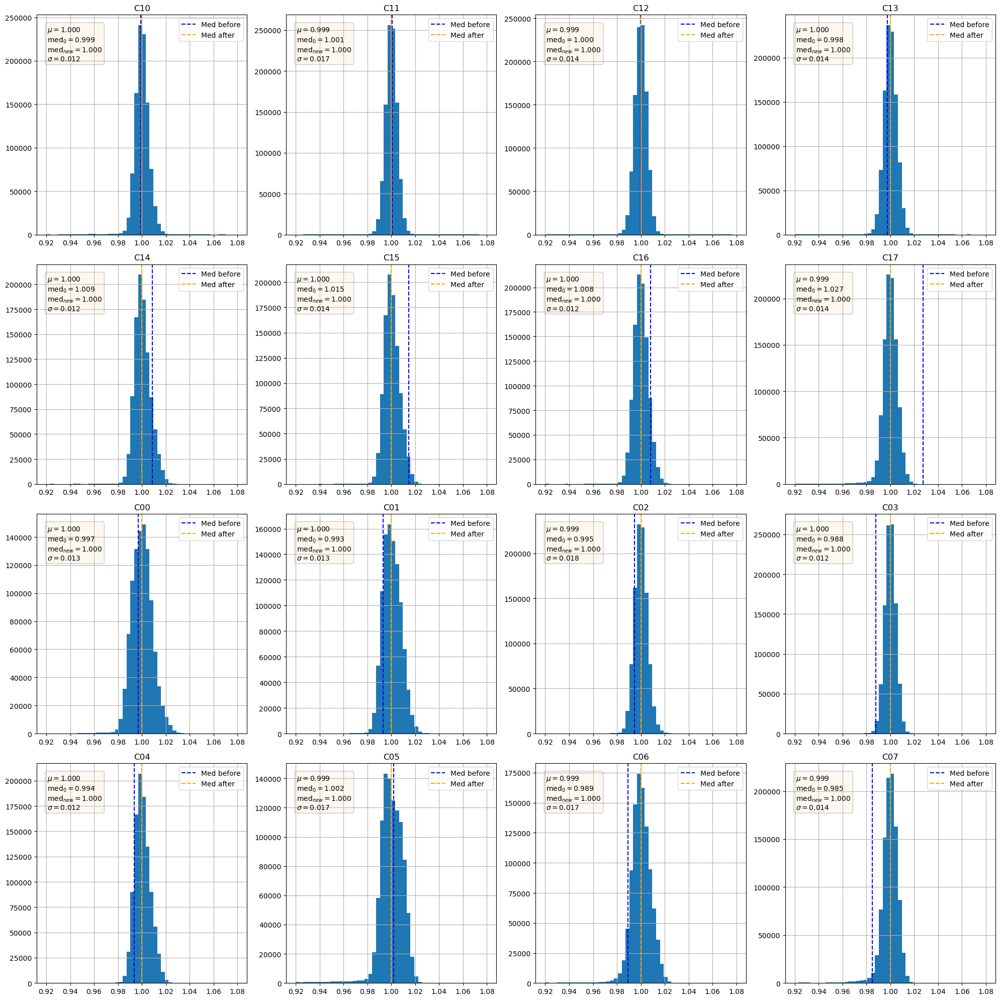

In [35]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data_ = all_img[idx].flatten()
    data_median_ = np.median(data_)
    data_ = data_/data_median_
    
    ax.hist(data_,bins=50,range=(0.92,1.08))

    mu = data_.mean()
    median_after = np.median(data_)
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}_{0}=%.3f$' % (data_median_, ),
    r'$\mathrm{med}_{new}=%.3f$' % (median_after, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=data_median_,ls='--',color='b',label='Med before')
    ax.axvline(x=median_after,ls='--',color='orange',label='Med after')
    #ax.set_yscale("log")
    ax.grid()
    ax.set_title(all_nameimg[idx])
    ax.legend(loc="upper right")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
 
plt.tight_layout()
plt.savefig(os.path.join(outdir,'01_histograms_amplis_normalised.png'))

## Now, before making the smoothing, we can evaluate whether there is a vertical gradient and decide what to do with it 

In [36]:
print(ampli0_name,id0)
print(np.median(all_img[id0]))
ampli0_norm = all_img[id0]/np.median(all_img[id0])

C00 15
0.99719274


In [37]:
col1_norm = ampli0_norm[5:,column1]
col2_norm = ampli0_norm[5:,column2]

We group the column values in bins of *delta_pix* size 

In [38]:
delta_pix = 1

In [39]:
vec_median_1 = []
vec_median_2 = []
for i in np.arange(0,len(col1_norm),delta_pix):
    vec_median_1.append(np.median(col1_norm[i:i+delta_pix]))
    vec_median_2.append(np.median(col2_norm[i:i+delta_pix]))
vec_median_1 = np.array(vec_median_1)
vec_median_2 = np.array(vec_median_2)

In [40]:
print(len(vec_median_1),len(vec_median_2))

1995 1995


We select the pixel bins that are within a given $\sigma \, \times$ median (note that, by definition, the global median of each normalised amplifier is 1). Then, we fit those bins to a linear model to characterise the gradient 

In [41]:
sigma_color = {1:'orange',2:'purple',3:'k'}

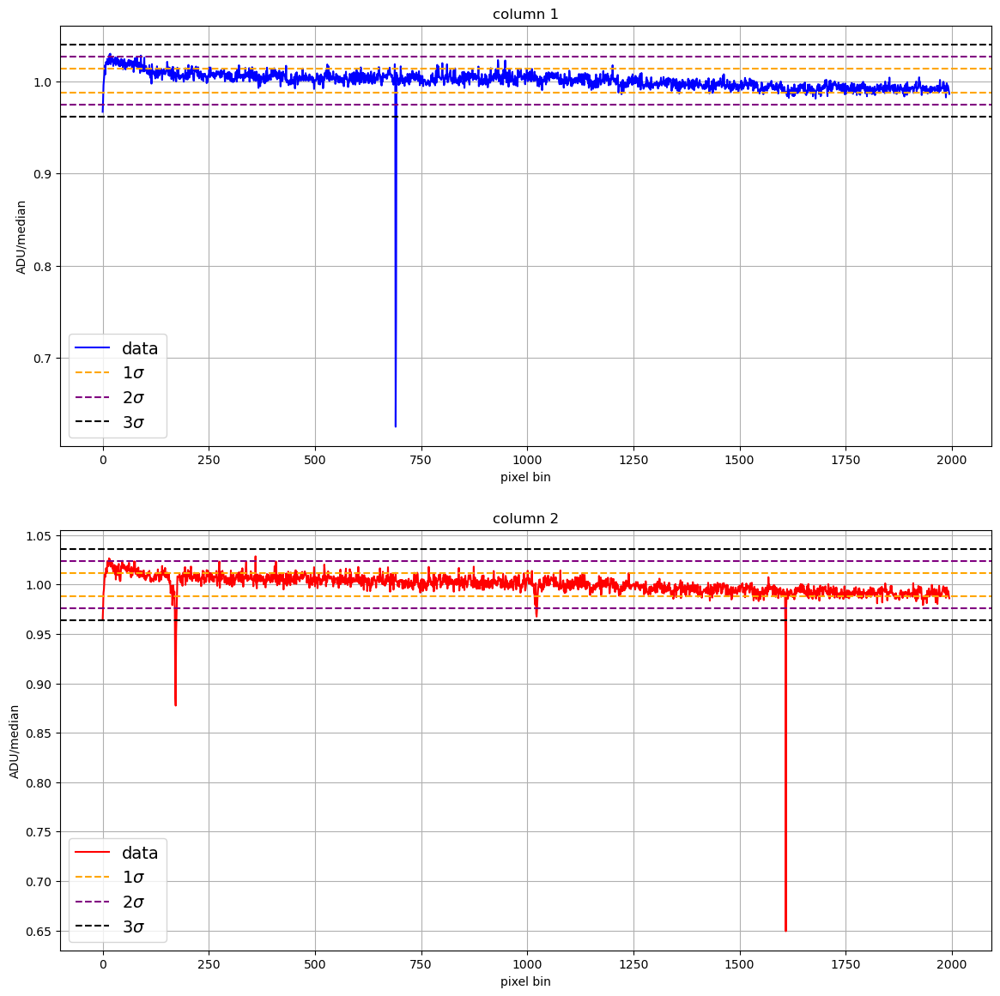

In [42]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    
    x_ = np.arange(len(vec_median_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,vec_median_,ls='-',color=col_color[i-1],label='data')
    
    vec_med_ = np.median(vec_median_)
    vec_std_ = np.std(vec_median_)
    
    for n in range(1,4):
        ax.axhline(y=vec_med_-n*vec_std_,ls='--',color=sigma_color[n])
        ax.axhline(y=vec_med_+n*vec_std_,ls='--',color=sigma_color[n])
        #ax.axhline(y=1.-n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        #ax.axhline(y=1.+n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        ax.plot([],[],ls='--',color=sigma_color[n],label='{0}'.format(n)+r'$\sigma$')
    
    #ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel bin')
    ax.set_ylabel('ADU/median')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best",fontsize=14)

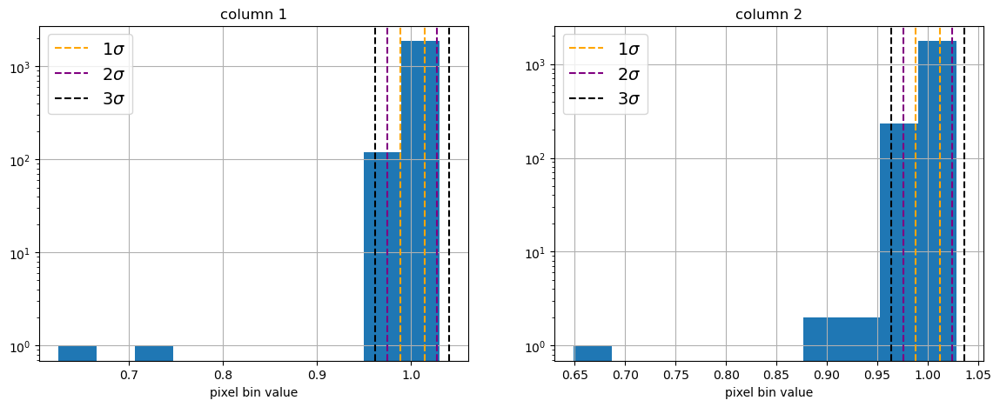

In [43]:
fig = plt.figure(figsize=(14,5))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    
    ax=fig.add_subplot(1,2,i)
    ax.hist(vec_median_)
    
    vec_med_ = np.median(vec_median_)
    vec_std_ = np.std(vec_median_)
    
    for n in range(1,4):
        #print(1.-n*np.std(vec_median_))
        ax.axvline(x=vec_med_-n*vec_std_,ls='--',color=sigma_color[n])
        ax.axvline(x=vec_med_+n*vec_std_,ls='--',color=sigma_color[n])
        #ax.axvline(x=1.-n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        #ax.axvline(x=1.+n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        ax.plot([],[],ls='--',color=sigma_color[n],label='{0}'.format(n)+r'$\sigma$')
    
    #ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.set_yscale("log")
    ax.grid()
    ax.set_xlabel('pixel bin value')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best",fontsize=14)

We define a simple linear function to fit the trend and later remove the potential gradient 

In [44]:
def grad_model(x,a,b):
    return a*x+b

We select $\sigma = 1$ 

In [45]:
sigma_fit = 1.

In [46]:
vec_med_1 = np.median(vec_median_1)
vec_med_2 = np.median(vec_median_2)
vec_std_1 = np.std(vec_median_1)
vec_std_2 = np.std(vec_median_2)

sigma_mask1 = (vec_median_1>=vec_med_1-sigma_fit*vec_std_1)*(vec_median_1<=vec_med_1+sigma_fit*vec_std_1)
sigma_mask2 = (vec_median_2>=vec_med_2-sigma_fit*vec_std_2)*(vec_median_2<=vec_med_2+sigma_fit*vec_std_2)

In [47]:
x1_fit = np.arange(len(vec_median_1))[sigma_mask1]
x2_fit = np.arange(len(vec_median_2))[sigma_mask2]
vec_median_1_fit = vec_median_1[sigma_mask1]
vec_median_2_fit = vec_median_2[sigma_mask2]

In [48]:
param1,cov1 = curve_fit(grad_model,x1_fit,vec_median_1_fit)
param2,cov2 = curve_fit(grad_model,x2_fit,vec_median_2_fit)

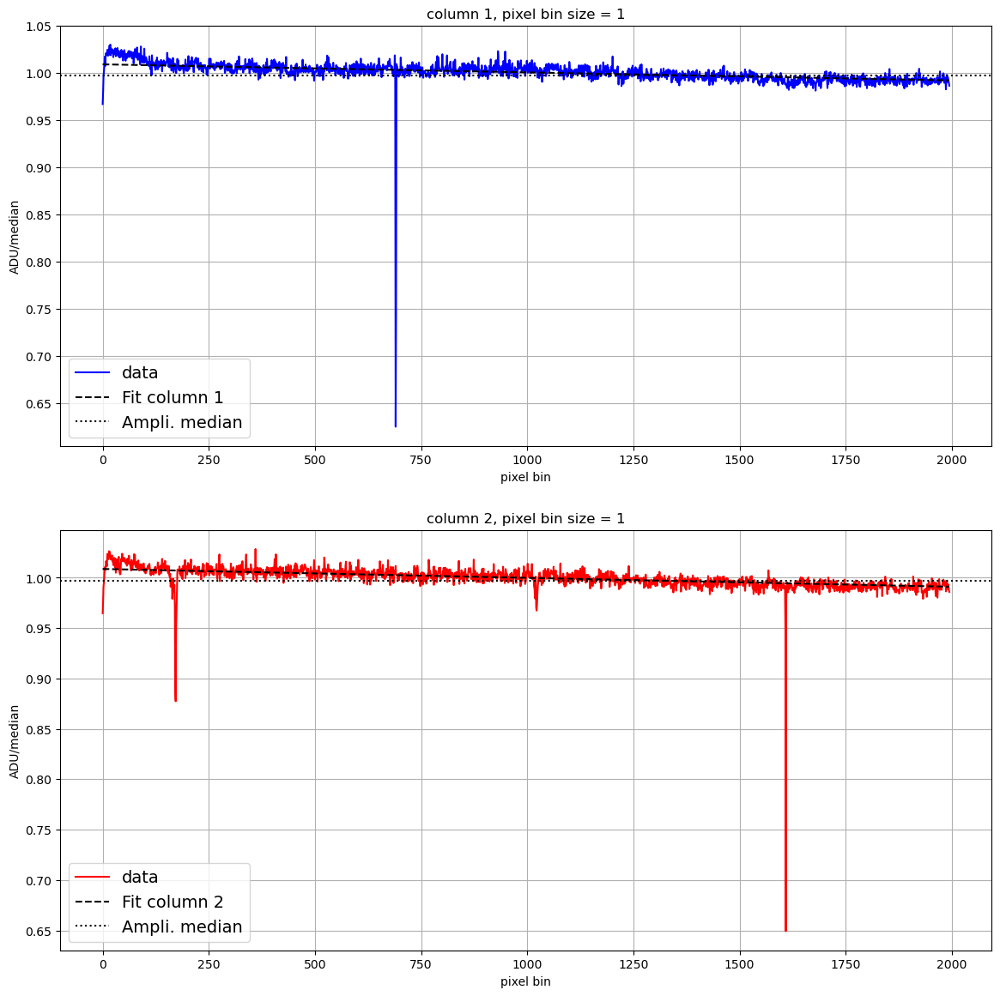

In [49]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    params_ = eval('param{0}'.format(i))
    
    x_ = np.arange(len(vec_median_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,vec_median_,ls='-',color=col_color[i-1],label='data')
    ax.plot(x_,grad_model(x_,params_[0],params_[1]),ls='--',color='k',label='Fit column {0}'.format(i))
    
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel bin')
    ax.set_ylabel('ADU/median')
    ax.set_title('column {0}, pixel bin size = {1}'.format(i,delta_pix))
    ax.legend(loc="best",fontsize=14)

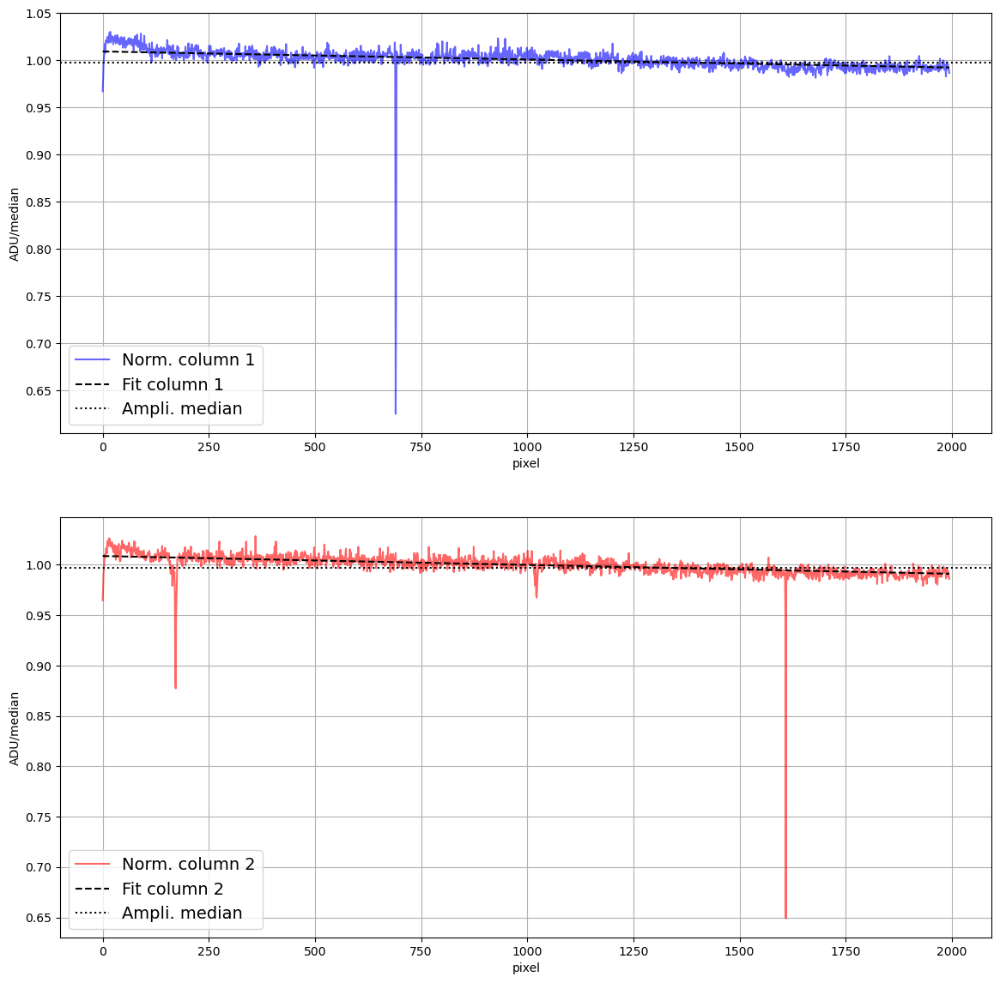

In [50]:
fig = plt.figure(figsize=(14,14))

for i in range(1,3):
    col_norm_ = eval('col{0}_norm'.format(i))
    params_ = eval('param{0}'.format(i))
    
    x_ = np.arange(len(col_norm_))

    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_norm_,ls='-',color=col_color[i-1],alpha=0.6,label='Norm. column {0}'.format(i))
    ax.plot(x_,grad_model(x_,params_[0],params_[1]),ls='--',color='k',label='Fit column {0}'.format(i))
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    #ax.set_ylim(0.95,1.05)
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_ylabel('ADU/median')
    ax.legend(loc="best",fontsize=14)

In [51]:
ampli0.shape

(2000, 509)

In [52]:
print(delta_pix)
print(sigma_fit)

1
1.0


In [53]:
remove_gradient = False

## Now, if we want to remove the vertical gradient, let's do this process for all columns of all amplis: 

1. Normalise each amplifier by its median value 
2. For each column, bin the pixel values in bins of *delta_pix* size (note that this may be equal to 1, that is, we don't bin) and reject the values out of $[median - n \cdot \sigma, median + n \cdot \sigma]$, with $\sigma$ the standard deviation of each column 
3. Fit those values with a linear function 
4. Devide each column by the fit, so we remove any (vertical) gradient there may be 
5. Store the new image in an array 

## If not, simply see and apply the step 1. for now 

In [54]:
load_norm_flat = True

In [55]:
if load_norm_flat:
    #norm_array = np.load(os.path.join(outdir,'ccd_median_normalised_flat.npy'))
    norm_file = fits.open(os.path.join(outdir,'ccd_median_normalised_flat_{0}_{1}.fits'.format(flat_selected,filter_)))
    norm_array = norm_file[1].data
    
else:
    for iampli in mapampid:
        #iampli = mapampid[idx]
        iampli_name = all_nameimg[iampli]
        print(iampli,iampli_name)
        
        amp_data = np.copy(all_img[iampli])
        amp_median = np.median(all_img[iampli].flatten())
        amp_norm_ = amp_data/amp_median
        #amp_norm = np.zeros((amp_norm_.shape[0],amp_norm_.shape[1]))
        
        #col1_norm = ampli0_norm[5:,column1]
        if remove_gradient:
            amp_norm = np.zeros((amp_norm_.shape[0],amp_norm_.shape[1]))
            for icolumn in range(amp_norm_.shape[1]):
                coli_norm = amp_norm_[:,icolumn]
                vec_median_i = []
                for i in np.arange(0,len(coli_norm),delta_pix):
                    vec_median_i.append(np.median(coli_norm[i:i+delta_pix]))
                vec_median_i = np.array(vec_median_i)

                vec_med_i = np.median(vec_median_i)
                vec_std_i = np.std(vec_median_i)

                sigma_mask_i = (vec_median_i>=vec_med_i-sigma_fit*vec_std_i)*(vec_median_i<=vec_med_i+sigma_fit*vec_std_i)

                xi_fit = np.arange(len(vec_median_i))[sigma_mask_i]
                vec_median_i_fit = vec_median_i[sigma_mask_i]

                parami,covi = curve_fit(grad_model,xi_fit,vec_median_i_fit)

                xi_ = np.arange(len(coli_norm))
                modeli = grad_model(xi_,parami[0],parami[1])

                amp_norm[:,icolumn] = coli_norm/modeli
        
        else:
            amp_norm = amp_norm_
        
        if iampli<=7:
            if iampli==0:
                data_up = amp_norm
            else:
                data_up = np.concatenate((data_up,amp_norm),axis=1)
        else:
            if iampli==15:
                data_down = amp_norm
            else:
                data_down = np.concatenate((data_down,amp_norm),axis=1)
    norm_array = np.concatenate((data_down,data_up),axis=0)
    #np.save(os.path.join(outdir,'ccd_median_normalised_flat.npy'),norm_array)
    
    
    hdr = fits.Header()
    
    for key,value in md.items():
        hdr[str(key)] = value
    
    primary_hdu = fits.PrimaryHDU(header=hdr)
    image_hdu = fits.ImageHDU(norm_array)
    
    hdu_list = fits.HDUList([primary_hdu, image_hdu])
    
    hdu_list.writeto(os.path.join(outdir,'ccd_median_normalised_flat_{0}_{1}.fits'.format(flat_selected,filter_)),overwrite=True)
    
    
    

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
15 C00
14 C01
13 C02
12 C03
11 C04
10 C05
9 C06
8 C07


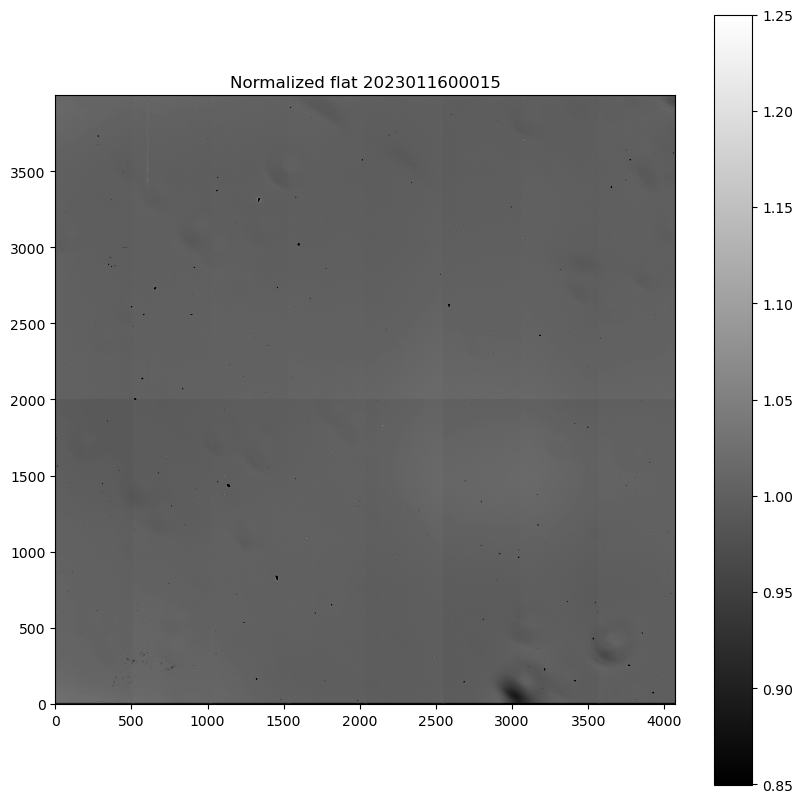

In [56]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(norm_array,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
plt.colorbar(im,ax=ax)
ax.set_title('Normalized flat {0}'.format(flat_selected))
plt.savefig(os.path.join(outdir,'02_normalised_flat.png'))

## Now we apply the smoothing on the normalised (and detrended) flat 

We try different window sizes for the median smoothing: 

In [57]:
window_sizes = np.array([2,5,10,20,30,40,50])

In [86]:
# Set this to True if the smoothed flats were not computed before 
load_smooths = True

In [59]:
if load_smooths:
    smooth_list_ws = np.load(os.path.join(outdir,'ccd_smoothed_flat_{0}_{1}.npy'.format(flat_selected,filter_)))[0]
else:
    smooth_list_ws = []
    for ws in window_sizes:
        print(ws)
        smooth_ws = ndimage.median_filter(norm_array,size=ws)
        smooth_list_ws.append(smooth_ws)
    np.save(os.path.join(outdir,'ccd_smoothed_flat_{0}_{1}.npy'.format(flat_selected,filter_)),[smooth_list_ws])

2
5
10
20
30
40
50


Now we look at the smoothed image on our reference amplifier with the different window size values 

In [60]:
all_boximg[ampli0_name]

(0, 509, 0, 2000)

Select a test window size 

In [61]:
test_ws = 40

In [62]:
x0 = all_boximg[ampli0_name][0]
x1 = all_boximg[ampli0_name][1]
y0 = all_boximg[ampli0_name][2]
y1 = all_boximg[ampli0_name][3]

smooth0 = smooth_list_ws[np.where(window_sizes==test_ws)[0][0]][y0:y1,x0:x1]

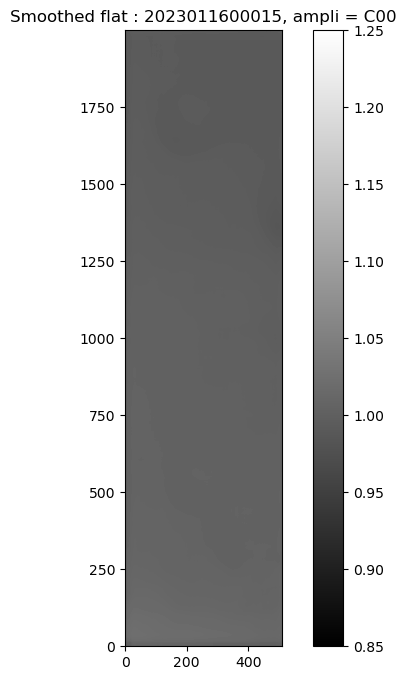

In [87]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
im = ax.imshow(smooth0,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
title = 'Smoothed flat : {0}, ampli = {1}'.format(flat_selected,ampli0_name)
ax.set_title(title)
plt.colorbar(im,ax=ax)

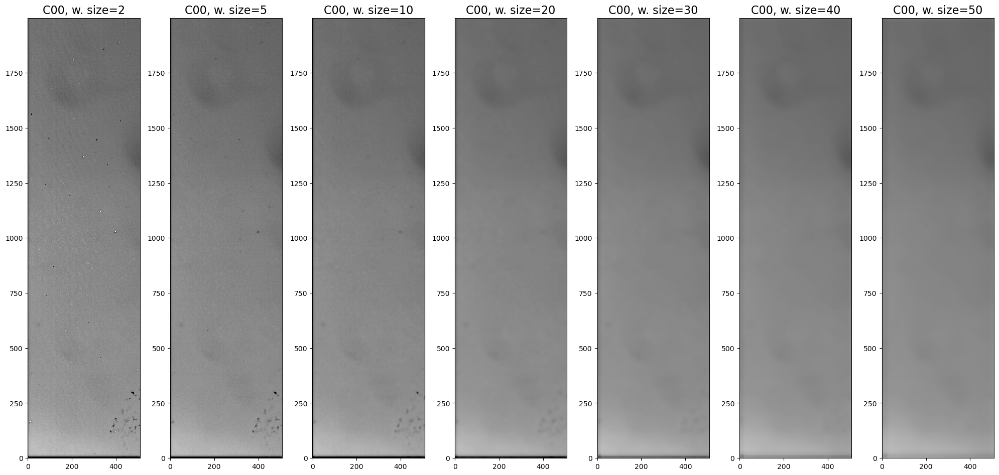

In [64]:
fig=plt.figure(figsize=(20,12))
for ismooth in range(len(window_sizes)):
    ax=fig.add_subplot(1,len(window_sizes),ismooth+1)
    smooth_ = smooth_list_ws[ismooth][y0:y1,x0:x1]
    ax.imshow(smooth_,origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title('{0}, w. size={1}'.format(ampli0_name,window_sizes[ismooth]),fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(outdir,'03_smoothed_flat_window_sizes.png'))

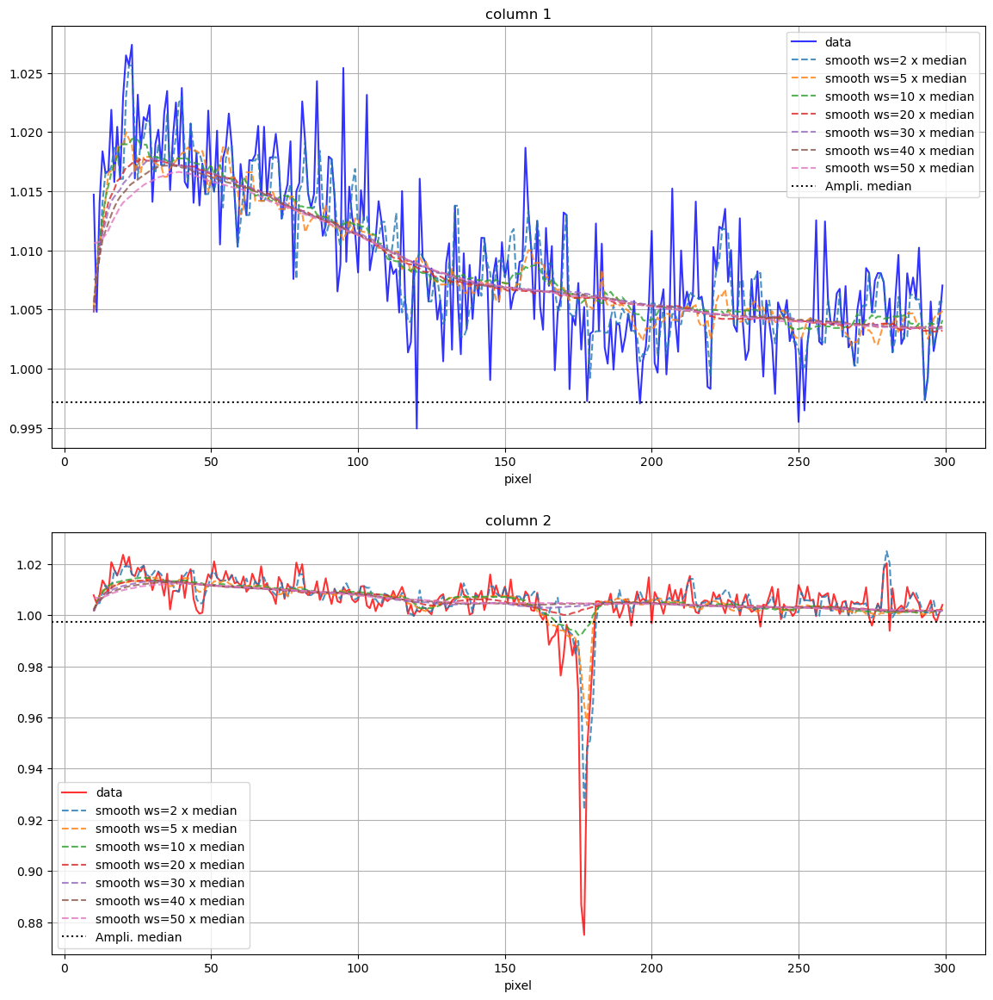

In [65]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],alpha=0.8,label='data'.format(i))
    for iws,ws in enumerate(window_sizes):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_smooth_*ampli0_median,ls='--',alpha=0.8,label='smooth ws={1} x median'.format(i,ws))
    
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig(os.path.join(outdir,'03_columns_window_sizes.png'))

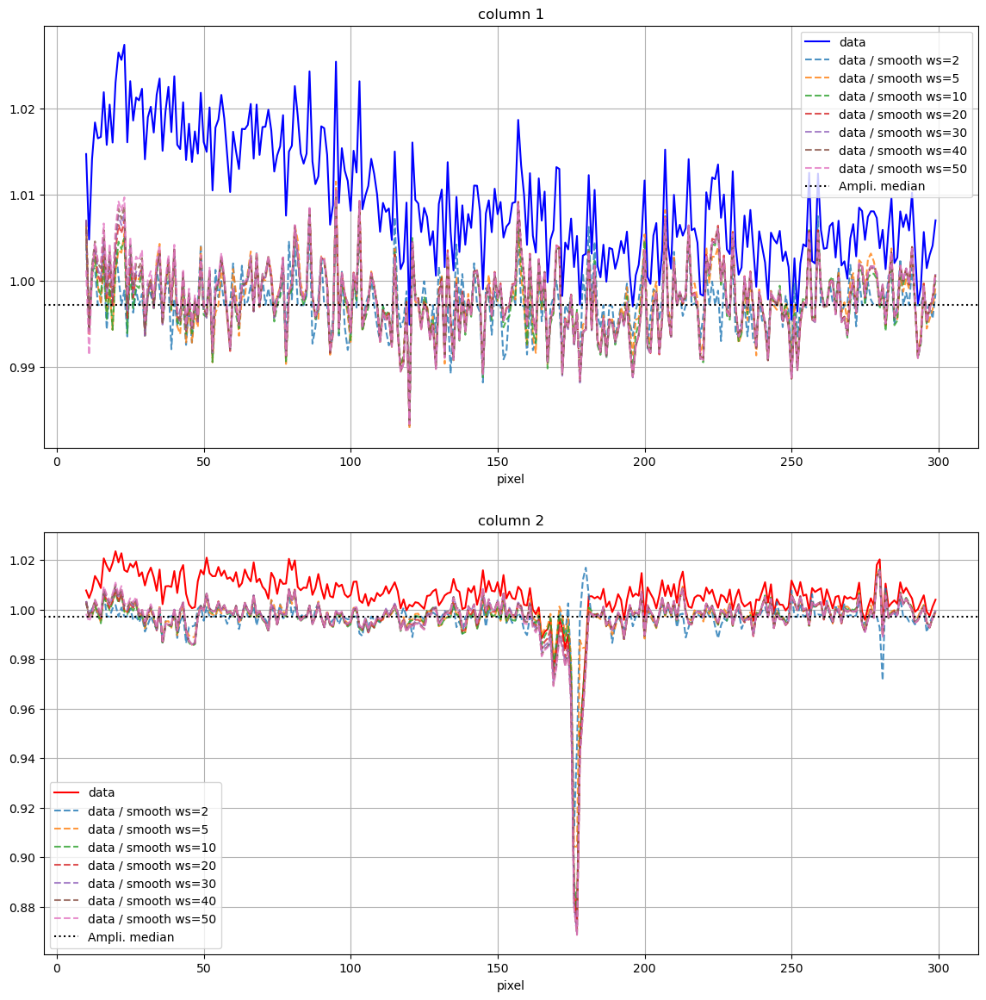

In [66]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig(os.path.join(outdir,'03_columns_window_sizes_removed.png'))

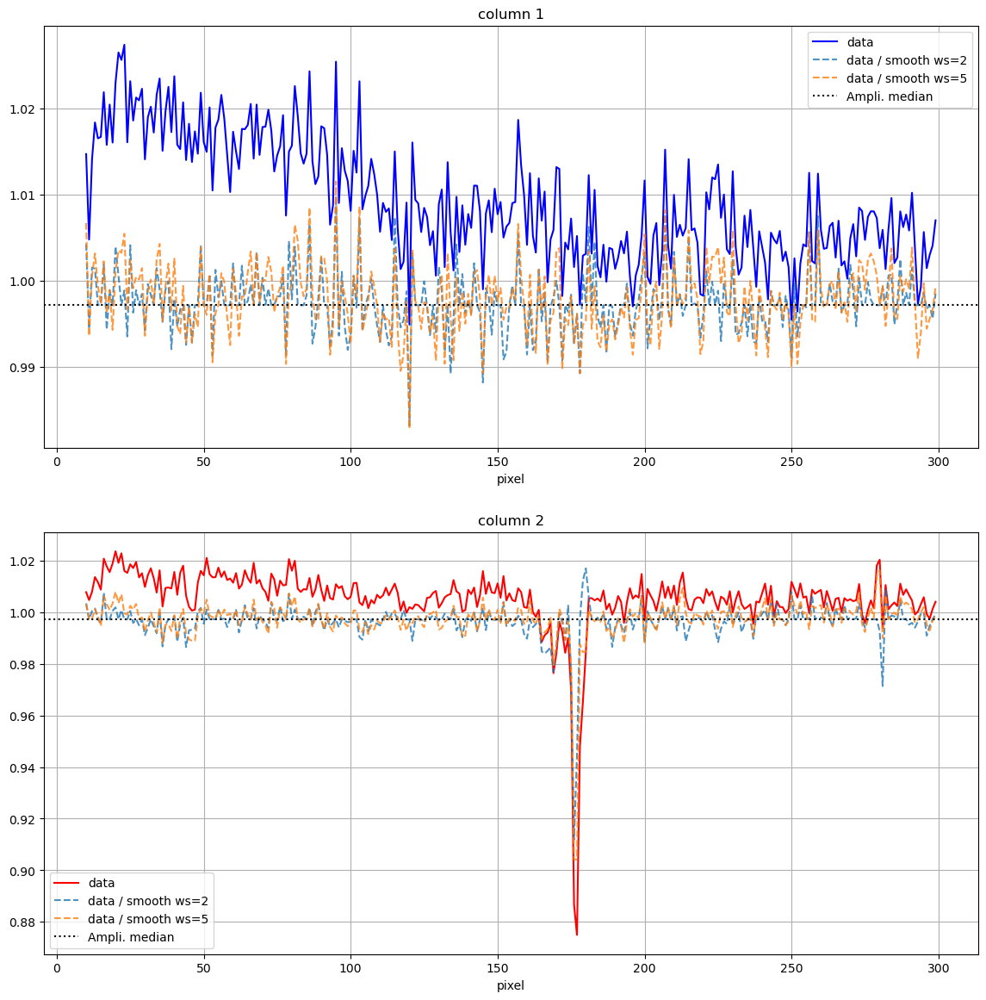

In [67]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes[:2]):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")

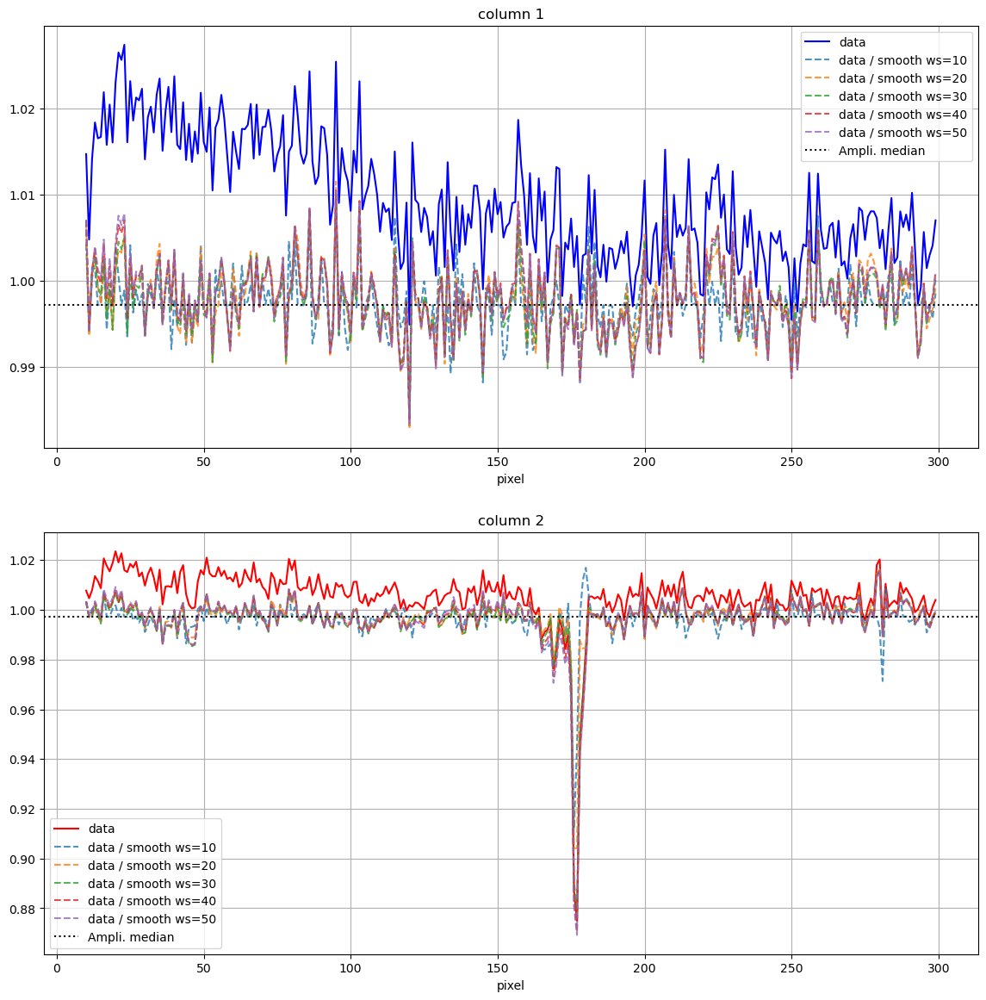

In [68]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes[2:]):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")

## The effect of the window size for the values selected does not seem very important. We select a value of 40 

In [69]:
window_size = 40

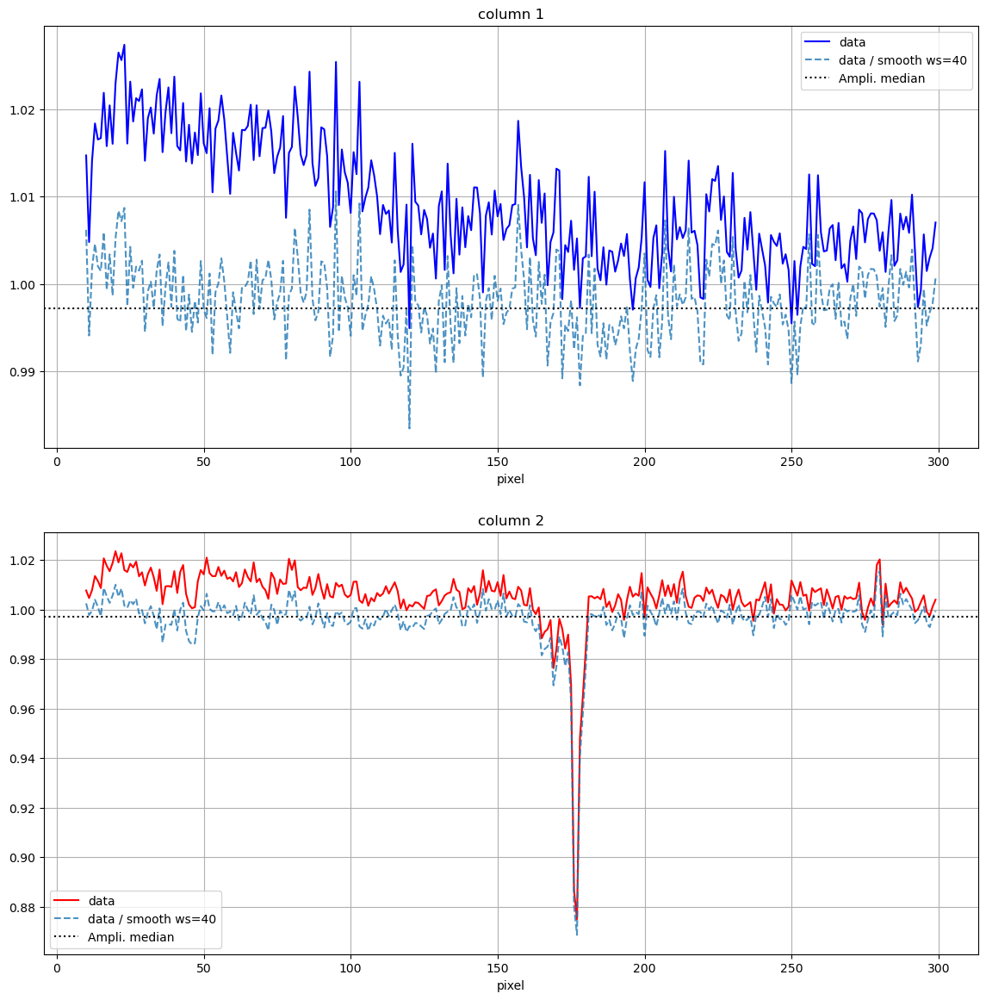

In [70]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    
    ws_index = np.where(window_sizes==window_size)[0][0]
    col_smooth_ = smooth_list_ws[ws_index][y0:y1,x0:x1][10:row,column_]
    ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(window_size))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig(os.path.join(outdir,'04_columns_deflatened_ws{0}.png'.format(window_size)))

We store the smoothed image separately for each amplifier: 

In [71]:
smooth_list = []
for ampli_name_ in all_nameimg:
    print(ampli_name_)
    
    x0_ = all_boximg[ampli_name_][0]
    x1_ = all_boximg[ampli_name_][1]
    y0_ = all_boximg[ampli_name_][2]
    y1_ = all_boximg[ampli_name_][3]
    
    smooth_i_ = smooth_list_ws[np.where(window_sizes==window_size)[0][0]][y0_:y1_,x0_:x1_]
    smooth_list.append(smooth_i_)
    

C10
C11
C12
C13
C14
C15
C16
C17
C07
C06
C05
C04
C03
C02
C01
C00


We show the smoothed images of each amplifier 

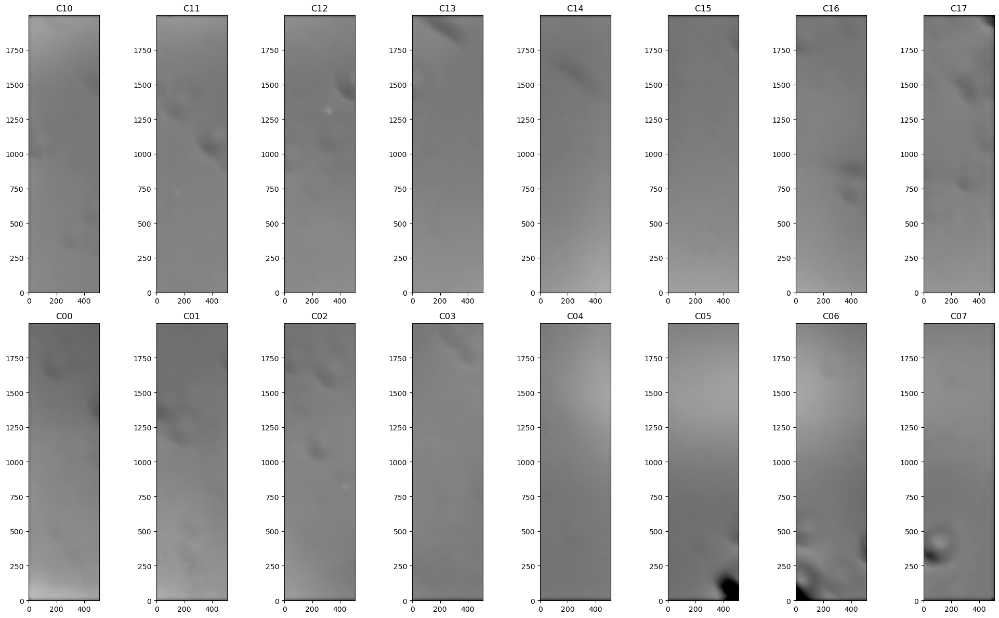

In [72]:
fig=plt.figure(figsize=(20,12))
for idx in range(num_amplis):
    
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.imshow(smooth_list[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig(os.path.join(outdir,'04_smooth_component_ws{0}.png'.format(window_size)))

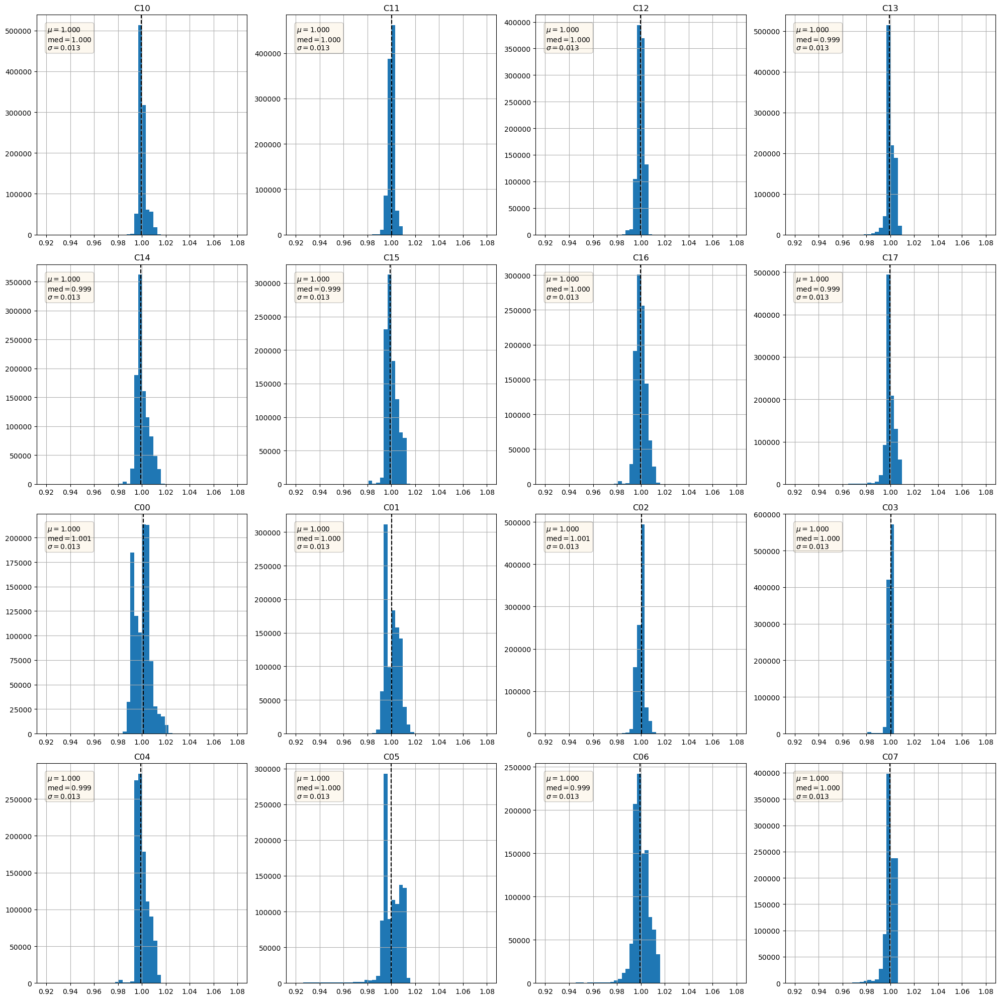

In [73]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data_smooth_ = smooth_list[idx].flatten()
    amp_median_ = np.median(data_smooth_)
    
    ax.hist(data_smooth_,bins=50,range=(0.92,1.08),alpha=1.0)

    mu = data_.mean()
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}=%.3f$' % (amp_median_, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=amp_median_,ls='--',color='k')
    ax.grid()
    ax.set_title(all_nameimg[idx])  
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
plt.tight_layout()
plt.savefig(os.path.join(outdir,'04_smooth_component_histogram_ws{0}.png'.format(window_size)))

And now we show the result of doing 

$$F_i^{\prime} = \frac{F_i}{S_i} \, ,$$

with $i$ running over the amplifiers. 

Since we have made the smoothing on the full image obtained after normalising each amplifier by its median, we DO NOT need to rescale the flat back to the original **global** median value by multiplying by it. 

NOTE: 

If we did not do this, then we would be dividing by the median smoothed images which preserve their own levels, so we would be approximately normalizing by the median, needing therefore to rescale it back to the original **global** median value by multiplying by it (all this is meant to be ampli by ampli). In reality, when dividing by the median smoothed images we would divide by a **spatially** dependent median, not the global one, so any slowly varying feature, such as a gradient, would be removed and it would not be recovered by simply multiplying by the original global median. We investigate this later. 

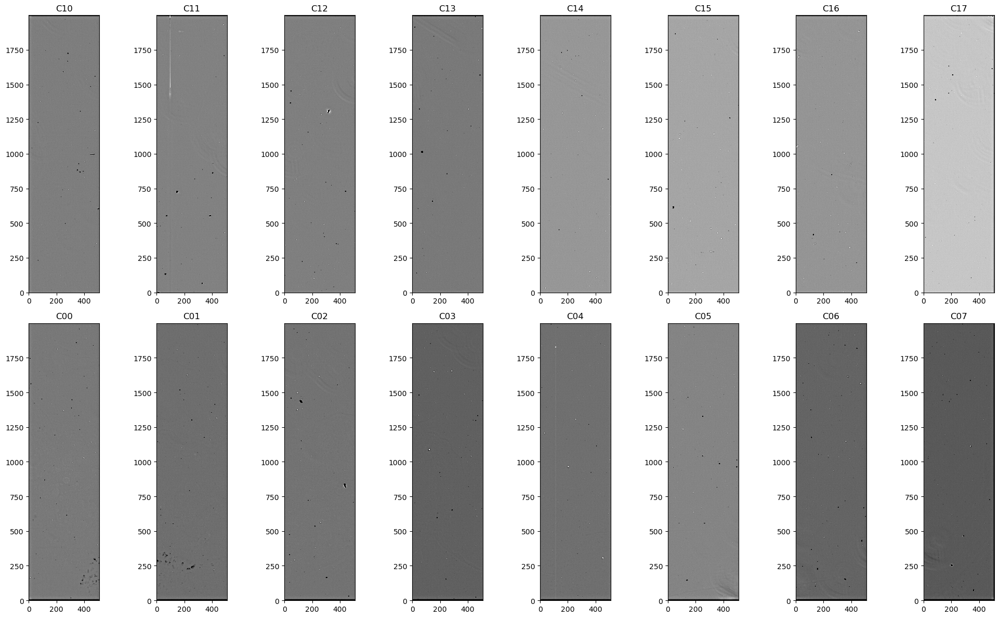

In [74]:
fig=plt.figure(figsize=(20,12))

for idx in range(num_amplis):
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    
    #amp_median = np.median(all_img[idx].flatten())
    
    ax.imshow(all_img[idx]/smooth_list[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig(os.path.join(outdir,'04_special_flat_amplis_ws{0}.png'.format(window_size)))

Let's see the distribution of the pixel values for each amplifier after removing the smooth components: 

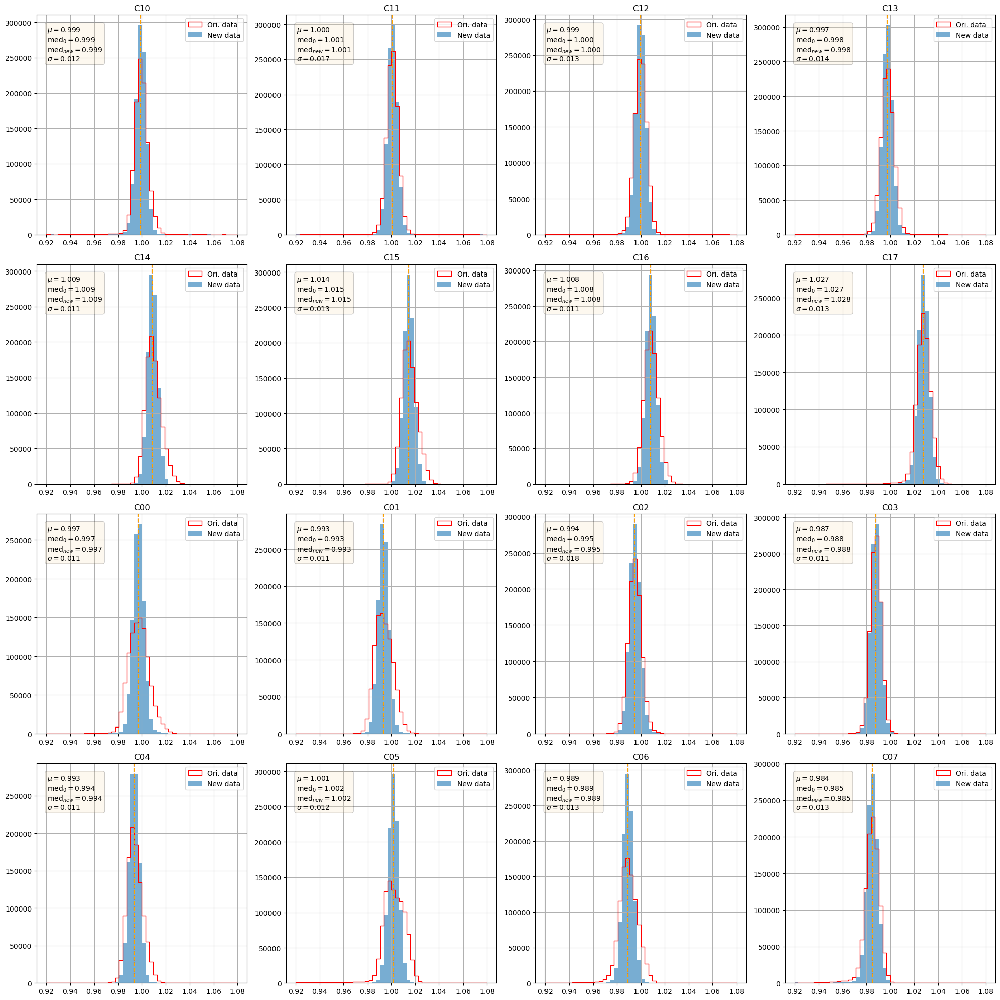

In [75]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data0_ = all_img[idx].flatten()
    amp_median = np.median(data0_)
    
    data_ = all_img[idx].flatten()/smooth_list[idx].flatten()
    
    ax.hist(data0_,bins=50,range=(0.92,1.08),histtype='step',color='r',label='Ori. data')
    ax.hist(data_,bins=50,range=(0.92,1.08),alpha=0.6,label='New data')

    mu = data_.mean()
    median_after = np.median(data_)
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}_{0}=%.3f$' % (amp_median, ),
    r'$\mathrm{med}_{new}=%.3f$' % (median_after, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=amp_median,ls='--',color='b')
    ax.axvline(x=median_after,ls='--',color='orange')
    ax.grid()
    ax.set_title(all_nameimg[idx])
    ax.legend(loc="upper right")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
 
plt.tight_layout()
plt.savefig(os.path.join(outdir,'04_histograms_special_flat_amplis_ws{0}.png'.format(window_size)))

We store the special flat in an array 

In [83]:

for iampli in mapampid:
    iampli_name = all_nameimg[iampli]
    print(iampli,iampli_name)

    amp_data_ = np.copy(all_img[iampli])
    amp_smooth_ = np.copy(smooth_list[iampli])
    smooth_data_ = amp_data_/amp_smooth_

    if iampli<=7:
        if iampli==0:
            data_up = smooth_data_
        else:
            data_up = np.concatenate((data_up,smooth_data_),axis=1)
    else:
        if iampli==15:
            data_down = smooth_data_
        else:
            data_down = np.concatenate((data_down,smooth_data_),axis=1)
special_array = np.concatenate((data_down,data_up),axis=0)
#np.save(os.path.join(outdir,'ccd_special_flat.npy'),norm_array)
    

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
15 C00
14 C01
13 C02
12 C03
11 C04
10 C05
9 C06
8 C07


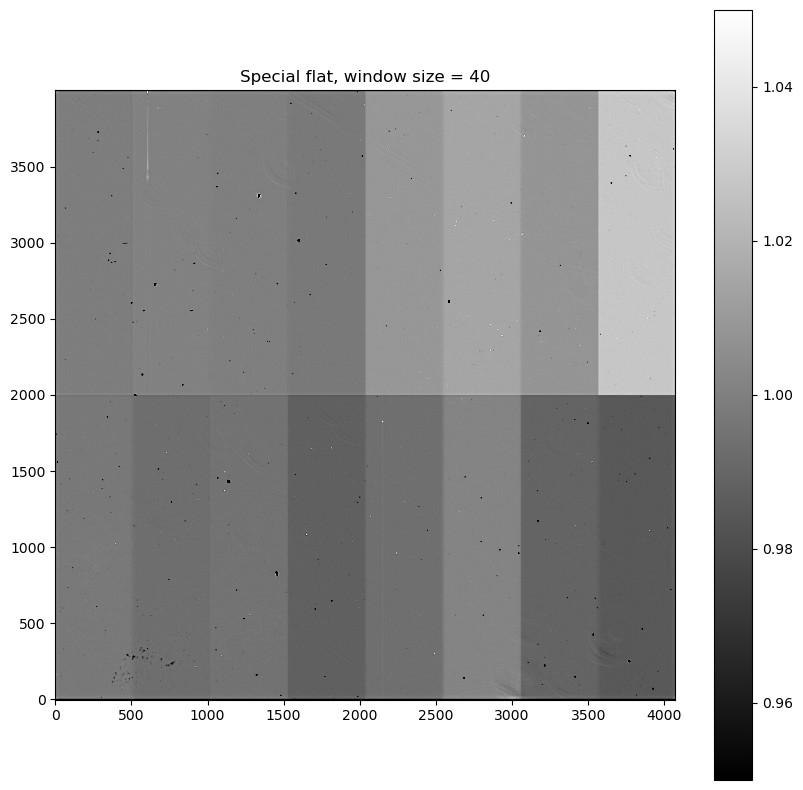

In [84]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(special_array,cmap="gray",vmin=0.95,vmax=1.05,origin='lower')#,norm=LogNorm())
ax.set_title('Special flat, window size = {0}'.format(window_size))
plt.colorbar(im,ax=ax)
plt.savefig(os.path.join(outdir,'04_special_flat_ws_{0}.png'.format(window_size)))

In [93]:
if save_sflat:
    filename_out = 'special_flat_{0}_{1}_ws_{2}.fits'.format(flat_selected,filter_,window_size)
    fullfilename_out = os.path.join(outdir,'../',filename_out)

    print(f">>>>  output filename {filename_out}")

    hdr = fits.Header()

    for key,value in md.items():
        hdr[str(key)] = value


    # Be carefull for Spectractor, 2 hdu units are necessary

    primary_hdu = fits.PrimaryHDU(header=hdr)
    image_hdu = fits.ImageHDU(special_array)

    hdu_list = fits.HDUList([primary_hdu, image_hdu])

    hdu_list.writeto(fullfilename_out,overwrite=True)

